# Imports

In [14]:
import pandas as pd
import numpy as np
import datetime as dt

%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

import fbprophet
from fbprophet.diagnostics import performance_metrics

# Read and Modify Data

In [15]:
df_Natural = pd.read_excel('Data.xlsx', sheet_name='Natural')
df_Caesarean = pd.read_excel('Data.xlsx', sheet_name='Caesarean Deliveries')

In [16]:
df_Natural['Admit_Month'] = pd.to_datetime(df_Natural['Admit_Month'], format='%Y%m')

In [17]:
df_Caesarean['Admit_Month'] = pd.to_datetime(df_Caesarean['Admit_Month'], format='%Y%m')

In [18]:
# df_Natural
# df_Caesarean

# Predictions
## Natural Births

In [19]:
# Prophet requires columns ds (Date) and y (Volume)
df_Natural = df_Natural.rename(columns={'Admit_Month': 'ds', 'Total_Cost': 'y'})

# Make the prophet model and fit on the data
# changepoint_prior_scale hyperparameter refers to the sensitivity of the trend to changes - bias vs. variance trade-off
Natural_prophet = fbprophet.Prophet(changepoint_prior_scale=0.05)
Natural_prophet.fit(df_Natural)

Natural_forecast = Natural_prophet.make_future_dataframe(periods=1, freq='Y')
Natural_forecast = Natural_prophet.predict(Natural_forecast)
# Natural_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(31)


INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


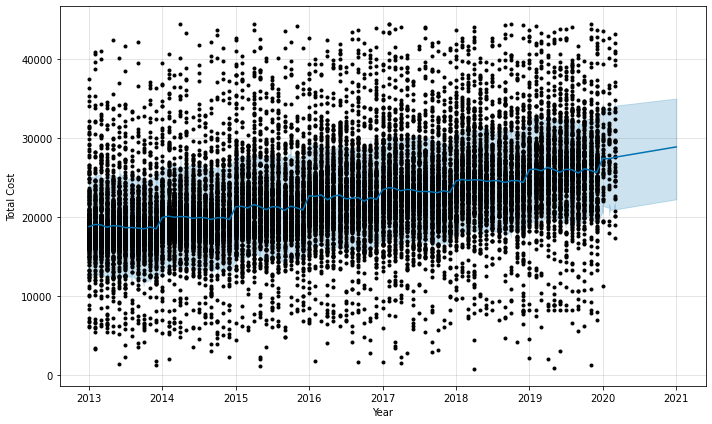

In [20]:
Natural_prophet.plot(Natural_forecast, xlabel = 'Year', ylabel = 'Total Cost')
plt.tight_layout()
plt.savefig('Output/NaturalPredictions.jpeg')

## Caesarean Births

In [21]:
# Prophet requires columns ds (Date) and y (Volume)
df_Caesarean = df_Caesarean.rename(columns={'Admit_Month': 'ds', 'Total_Cost': 'y'})

# Make the prophet model and fit on the data
# changepoint_prior_scale hyperparameter refers to the sensitivity of the trend to changes - bias vs. variance trade-off
Caesarean_prophet = fbprophet.Prophet(changepoint_prior_scale=0.05)
Caesarean_prophet.fit(df_Caesarean)

Caesarean_forecast = Caesarean_prophet.make_future_dataframe(periods=1, freq='Y')
Caesarean_forecast = Caesarean_prophet.predict(Caesarean_forecast)
# Caesarean_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(31)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


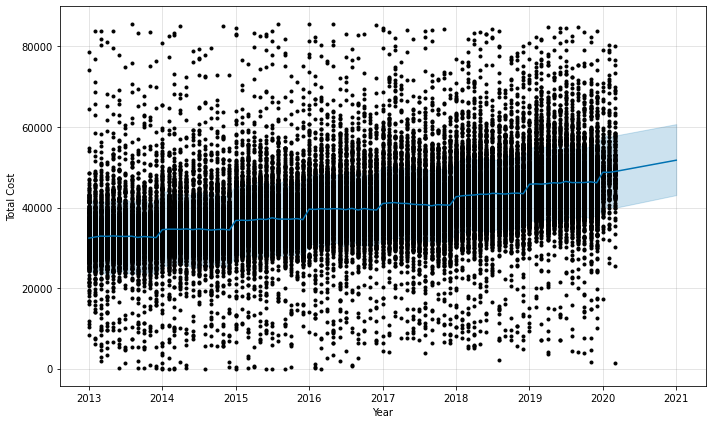

In [22]:
Caesarean_prophet.plot(Caesarean_forecast, xlabel = 'Year', ylabel = 'Total Cost')
plt.tight_layout()
plt.savefig('Output/CaesareanPredictions.jpeg')